<a href="https://colab.research.google.com/github/ocjorge/Yolo_vehicles/blob/main/YOLO.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
import tensorflow as tf
print("GPU disponible:", tf.config.list_physical_devices('GPU'))


GPU disponible: [PhysicalDevice(name='/physical_device:GPU:0', device_type='GPU')]


In [ ]:
!unzip "/content/datasets/dataset_vehiculos.zip" -d /content/datasets


Archive:  /content/datasets/dataset_vehiculos.zip
   creating: /content/datasets/dataset_vehiculos/
  inflating: /content/datasets/dataset_vehiculos/.DS_Store  
   creating: /content/datasets/dataset_vehiculos/images/
  inflating: /content/datasets/dataset_vehiculos/images/.DS_Store  
   creating: /content/datasets/dataset_vehiculos/images/test/
  inflating: /content/datasets/dataset_vehiculos/images/test/frame_0498.jpg  
  inflating: /content/datasets/dataset_vehiculos/images/test/frame_0467.jpg  
  inflating: /content/datasets/dataset_vehiculos/images/test/frame_0473.jpg  
  inflating: /content/datasets/dataset_vehiculos/images/test/frame_0472.jpg  
  inflating: /content/datasets/dataset_vehiculos/images/test/frame_0466.jpg  
  inflating: /content/datasets/dataset_vehiculos/images/test/frame_0458.jpg  
  inflating: /content/datasets/dataset_vehiculos/images/test/frame_0470.jpg  
  inflating: /content/datasets/dataset_vehiculos/images/test/frame_0464.jpg  
  inflating: /content/datase

In [2]:
import yaml

data = {
    'path': '../datasets/dataset_vehiculos',
    'train': 'images/train',
    'val': 'images/val',
    'test': 'images/test',
    'names': {
        0: 'car'
    }
}

with open('/content/datasets/dataset_vehiculos/data.yaml', 'w') as file:
    yaml.dump(data, file,
              default_flow_style=False,
              sort_keys=False)


FileNotFoundError: [Errno 2] No such file or directory: '/content/datasets/dataset_vehiculos/data.yaml'

In [1]:
!pip install ultralytics

In [ ]:
from ultralytics import YOLO

# 1. Cargar el modelo (nano, el más pequeño)
model = YOLO("yolo11n.pt")

# Afinar el modelo
results = model.train(data="/content/datasets/dataset_vehiculos/data.yaml",
                      epochs=50, # Número de iteraciones
                      imgsz=640, # Tamaño de las imágenes (máxima dimensión)
                      plots=True, # Guardar gráficos de entrenamiento
                      )

Ultralytics 8.3.146 🚀 Python-3.11.12 torch-2.6.0+cu124 CUDA:0 (Tesla T4, 15095MiB)
engine/trainer: agnostic_nms=False, amp=True, augment=False, auto_augment=randaugment, batch=16, bgr=0.0, box=7.5, cache=False, cfg=None, classes=None, close_mosaic=10, cls=0.5, conf=None, copy_paste=0.0, copy_paste_mode=flip, cos_lr=False, cutmix=0.0, data=/content/datasets/dataset_vehiculos/data.yaml, degrees=0.0, deterministic=True, device=None, dfl=1.5, dnn=False, dropout=0.0, dynamic=False, embed=None, epochs=50, erasing=0.4, exist_ok=False, fliplr=0.5, flipud=0.0, format=torchscript, fraction=1.0, freeze=None, half=False, hsv_h=0.015, hsv_s=0.7, hsv_v=0.4, imgsz=640, int8=False, iou=0.7, keras=False, kobj=1.0, line_width=None, lr0=0.01, lrf=0.01, mask_ratio=4, max_det=300, mixup=0.0, mode=train, model=yolo11n.pt, momentum=0.937, mosaic=1.0, multi_scale=False, name=train2, nbs=64, nms=False, opset=None, optimize=False, optimizer=auto, overlap_mask=True, patience=100, perspective=0.0, plots=True, pos

train: Scanning /content/datasets/dataset_vehiculos/labels/train.cache... 399 images, 0 backgrounds, 0 corrupt: 100%|██████████| 399/399 [00:00<?, ?it/s]

albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, method='weighted_average', num_output_channels=3), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))


val: Fast image access ✅ (ping: 0.0±0.0 ms, read: 692.8±376.5 MB/s, size: 127.9 KB)


val: Scanning /content/datasets/dataset_vehiculos/labels/val.cache... 50 images, 0 backgrounds, 0 corrupt: 100%|██████████| 50/50 [00:00<?, ?it/s]


Plotting labels to runs/detect/train2/labels.jpg... 
optimizer: 'optimizer=auto' found, ignoring 'lr0=0.01' and 'momentum=0.937' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: AdamW(lr=0.002, momentum=0.9) with parameter groups 81 weight(decay=0.0), 88 weight(decay=0.0005), 87 bias(decay=0.0)
Image sizes 640 train, 640 val
Using 2 dataloader workers
Logging results to runs/detect/train2
Starting training for 50 epochs...

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       1/50      2.57G      1.703      2.219      1.078        254        640: 100%|██████████| 25/25 [00:08<00:00,  2.98it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.19it/s]

                   all         50        243     0.0152      0.938      0.418      0.212



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       2/50      2.57G      1.569      1.032      1.036        255        640: 100%|██████████| 25/25 [00:06<00:00,  3.58it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  4.32it/s]

                   all         50        243          1      0.135      0.389      0.185



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       3/50      2.57G      1.545      0.947      1.039        279        640: 100%|██████████| 25/25 [00:07<00:00,  3.21it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  3.62it/s]

                   all         50        243      0.625        0.7       0.69      0.367



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       4/50      2.57G      1.498     0.8897      1.036        243        640: 100%|██████████| 25/25 [00:06<00:00,  3.90it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  3.89it/s]

                   all         50        243      0.781      0.852      0.872      0.432



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       5/50      2.57G      1.501     0.8637      1.034        230        640: 100%|██████████| 25/25 [00:07<00:00,  3.47it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  3.95it/s]

                   all         50        243      0.983       0.97       0.98      0.484



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       6/50      2.57G       1.44     0.8097       1.02        178        640: 100%|██████████| 25/25 [00:07<00:00,  3.37it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  3.09it/s]

                   all         50        243      0.994      0.988      0.995      0.527



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       7/50      2.57G      1.461     0.8045      1.019        254        640: 100%|██████████| 25/25 [00:06<00:00,  3.83it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  4.88it/s]

                   all         50        243      0.997      0.979      0.995      0.576



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       8/50      2.57G      1.409      0.779      1.011        276        640: 100%|██████████| 25/25 [00:07<00:00,  3.34it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  3.44it/s]

                   all         50        243      0.996      0.986      0.992      0.524



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       9/50      2.57G      1.418     0.7632      1.015        263        640: 100%|██████████| 25/25 [00:07<00:00,  3.45it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.46it/s]

                   all         50        243      0.983      0.992      0.993      0.567



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      10/50      2.57G       1.37      0.737      1.008        184        640: 100%|██████████| 25/25 [00:06<00:00,  3.75it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  4.63it/s]

                   all         50        243      0.973      0.984      0.994      0.591



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      11/50      2.57G      1.331     0.7137     0.9858        265        640: 100%|██████████| 25/25 [00:07<00:00,  3.29it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  3.00it/s]

                   all         50        243      0.993      0.979      0.995      0.593



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      12/50      2.57G      1.365     0.7106     0.9916        261        640: 100%|██████████| 25/25 [00:06<00:00,  3.78it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  3.05it/s]

                   all         50        243      0.996      0.974      0.994      0.578



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      13/50      2.57G      1.339     0.6824     0.9922        270        640: 100%|██████████| 25/25 [00:07<00:00,  3.54it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  4.38it/s]

                   all         50        243      0.992      0.971      0.993      0.567



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      14/50      2.57G      1.359     0.6823     0.9928        261        640: 100%|██████████| 25/25 [00:07<00:00,  3.35it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  3.30it/s]

                   all         50        243      0.977      0.975      0.993      0.614



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      15/50      2.57G      1.306     0.6709     0.9819        224        640: 100%|██████████| 25/25 [00:06<00:00,  3.82it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  4.14it/s]

                   all         50        243      0.956      0.988      0.991      0.578



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      16/50      2.57G      1.339     0.6768     0.9936        199        640: 100%|██████████| 25/25 [00:07<00:00,  3.28it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  3.34it/s]

                   all         50        243      0.971      0.978      0.993      0.601



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      17/50      2.57G      1.295     0.6509     0.9801        261        640: 100%|██████████| 25/25 [00:06<00:00,  3.60it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.00it/s]

                   all         50        243      0.977      0.984      0.992      0.607



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      18/50      2.57G      1.283      0.638     0.9831        267        640: 100%|██████████| 25/25 [00:06<00:00,  3.86it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  3.34it/s]

                   all         50        243       0.97      0.979      0.993      0.597



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      19/50      2.57G      1.259     0.6282     0.9721        232        640: 100%|██████████| 25/25 [00:07<00:00,  3.33it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  3.95it/s]

                   all         50        243      0.958      0.963      0.992       0.62



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      20/50      2.57G      1.259     0.6177      0.981        219        640: 100%|██████████| 25/25 [00:06<00:00,  3.75it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  3.68it/s]

                   all         50        243      0.995      0.988      0.995       0.66



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      21/50      2.57G      1.249     0.6035      0.971        229        640: 100%|██████████| 25/25 [00:07<00:00,  3.43it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  3.84it/s]

                   all         50        243      0.986      0.979      0.994      0.625



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      22/50      2.57G      1.251     0.6074     0.9786        270        640: 100%|██████████| 25/25 [00:07<00:00,  3.40it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  3.76it/s]

                   all         50        243      0.996      0.981      0.995      0.591



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      23/50      2.57G      1.253     0.6013     0.9677        295        640: 100%|██████████| 25/25 [00:06<00:00,  3.84it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  4.51it/s]

                   all         50        243          1      0.992      0.995      0.631



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      24/50      2.57G      1.237     0.6079     0.9682        309        640: 100%|██████████| 25/25 [00:07<00:00,  3.25it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  4.07it/s]

                   all         50        243          1      0.979      0.994      0.627



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      25/50      2.57G      1.213     0.5941     0.9687        227        640: 100%|██████████| 25/25 [00:06<00:00,  3.70it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.61it/s]

                   all         50        243      0.968      0.975      0.993      0.645



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      26/50      2.57G      1.194     0.5694     0.9626        243        640: 100%|██████████| 25/25 [00:07<00:00,  3.57it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  4.49it/s]

                   all         50        243      0.969      0.979      0.993      0.615



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      27/50      2.57G       1.19     0.5701     0.9566        237        640: 100%|██████████| 25/25 [00:08<00:00,  2.81it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  3.81it/s]

                   all         50        243      0.938      0.971      0.982      0.614



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      28/50      2.57G      1.183     0.5698     0.9537        242        640: 100%|██████████| 25/25 [00:06<00:00,  3.60it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.70it/s]

                   all         50        243       0.94      0.996      0.987      0.638



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      29/50      2.57G      1.189     0.5745     0.9558        331        640: 100%|██████████| 25/25 [00:07<00:00,  3.48it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  5.38it/s]

                   all         50        243      0.941      0.996      0.992       0.64



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      30/50      2.57G      1.183     0.5641      0.956        275        640: 100%|██████████| 25/25 [00:07<00:00,  3.28it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  3.20it/s]

                   all         50        243      0.989      0.979      0.994      0.631



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      31/50      2.57G      1.174     0.5628     0.9578        223        640: 100%|██████████| 25/25 [00:06<00:00,  3.70it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  3.96it/s]

                   all         50        243       0.94      0.996      0.992       0.65



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      32/50      2.57G      1.188     0.5623     0.9599        228        640: 100%|██████████| 25/25 [00:07<00:00,  3.19it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  4.13it/s]

                   all         50        243      0.971      0.979      0.993      0.675



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      33/50      2.57G       1.18     0.5579     0.9583        240        640: 100%|██████████| 25/25 [00:07<00:00,  3.34it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.95it/s]

                   all         50        243      0.993      0.975      0.994      0.666



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      34/50      2.57G       1.15     0.5437      0.941        274        640: 100%|██████████| 25/25 [00:06<00:00,  3.91it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  4.97it/s]

                   all         50        243      0.948      0.988      0.992      0.643



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      35/50      2.57G      1.141     0.5371     0.9489        270        640: 100%|██████████| 25/25 [00:07<00:00,  3.30it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  4.53it/s]

                   all         50        243      0.942      0.994      0.992      0.634



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      36/50      2.57G      1.143     0.5322     0.9411        231        640: 100%|██████████| 25/25 [00:06<00:00,  3.93it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  3.03it/s]

                   all         50        243      0.941      0.996      0.991       0.65



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      37/50      2.57G      1.132     0.5327      0.945        208        640: 100%|██████████| 25/25 [00:07<00:00,  3.53it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  4.19it/s]

                   all         50        243      0.953      0.984      0.992      0.662



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      38/50      2.57G       1.11     0.5234     0.9347        190        640: 100%|██████████| 25/25 [00:07<00:00,  3.39it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  3.80it/s]

                   all         50        243       0.96      0.987      0.993      0.673



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      39/50      2.57G      1.138      0.531     0.9494        230        640: 100%|██████████| 25/25 [00:06<00:00,  3.85it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  4.61it/s]

                   all         50        243      0.941      0.996       0.99       0.65



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      40/50      2.57G      1.103     0.5192     0.9316        290        640: 100%|██████████| 25/25 [00:07<00:00,  3.28it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  5.34it/s]

                   all         50        243      0.934      0.984      0.988       0.67


Closing dataloader mosaic
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, method='weighted_average', num_output_channels=3), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      41/50      2.57G      1.099      0.536      0.936        145        640: 100%|██████████| 25/25 [00:08<00:00,  2.94it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.60it/s]

                   all         50        243      0.941      0.987      0.985       0.66



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      42/50      2.57G      1.095      0.517     0.9377        137        640: 100%|██████████| 25/25 [00:06<00:00,  4.00it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  4.40it/s]

                   all         50        243      0.955      0.971      0.991      0.681



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      43/50      2.57G      1.081     0.5084     0.9337        131        640: 100%|██████████| 25/25 [00:07<00:00,  3.19it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  3.50it/s]

                   all         50        243      0.941      0.987      0.989      0.669



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      44/50      2.57G      1.062     0.4978     0.9304        135        640: 100%|██████████| 25/25 [00:06<00:00,  3.74it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  3.87it/s]

                   all         50        243      0.943      0.988       0.99      0.661



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      45/50      2.57G       1.07     0.4971     0.9306        138        640: 100%|██████████| 25/25 [00:07<00:00,  3.45it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  4.60it/s]

                   all         50        243      0.945      0.983       0.99      0.671



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      46/50      2.57G      1.042     0.4863     0.9258        133        640: 100%|██████████| 25/25 [00:07<00:00,  3.38it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.97it/s]

                   all         50        243      0.948      0.984      0.992      0.671



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      47/50      2.57G      1.038     0.4874     0.9186        139        640: 100%|██████████| 25/25 [00:06<00:00,  3.90it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  4.33it/s]

                   all         50        243      0.951      0.984      0.992      0.679



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      48/50      2.57G      1.033     0.4854       0.92        139        640: 100%|██████████| 25/25 [00:07<00:00,  3.30it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  5.05it/s]

                   all         50        243      0.956      0.975      0.993      0.682



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      49/50      2.57G      1.025     0.4771     0.9197        142        640: 100%|██████████| 25/25 [00:06<00:00,  4.04it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  3.82it/s]

                   all         50        243      0.957      0.975      0.993      0.682



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      50/50      2.57G      1.025     0.4798     0.9168        142        640: 100%|██████████| 25/25 [00:06<00:00,  3.61it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  5.34it/s]

                   all         50        243      0.956      0.974      0.992       0.68



50 epochs completed in 0.113 hours.
Optimizer stripped from runs/detect/train2/weights/last.pt, 5.4MB
Optimizer stripped from runs/detect/train2/weights/best.pt, 5.4MB

Validating runs/detect/train2/weights/best.pt...
Ultralytics 8.3.146 🚀 Python-3.11.12 torch-2.6.0+cu124 CUDA:0 (Tesla T4, 15095MiB)
YOLO11n summary (fused): 100 layers, 2,582,347 parameters, 0 gradients, 6.3 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  3.04it/s]


                   all         50        243      0.957      0.975      0.993      0.682
Speed: 0.1ms preprocess, 2.3ms inference, 0.0ms loss, 2.8ms postprocess per image
Results saved to runs/detect/train2


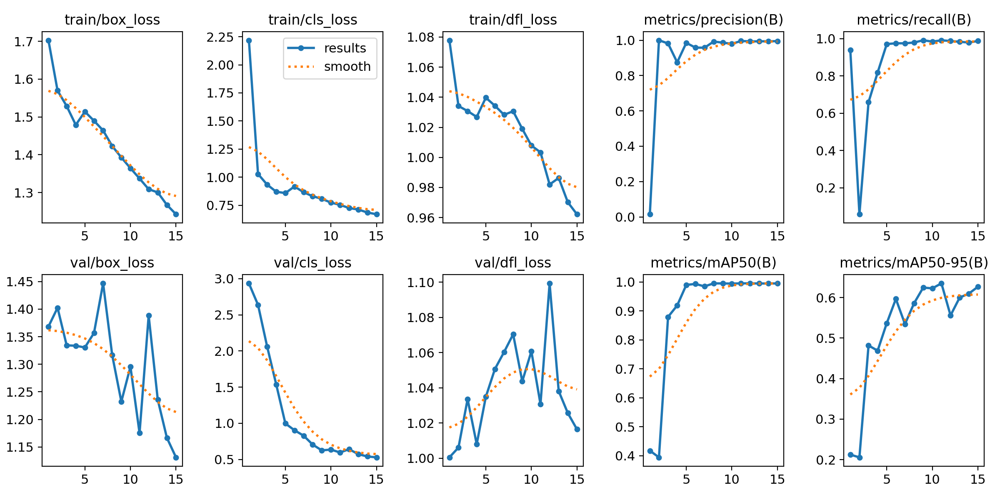

In [ ]:
from IPython.display import Image as IPyImage

IPyImage(filename='/content/runs/detect/train/results.png', width=800)

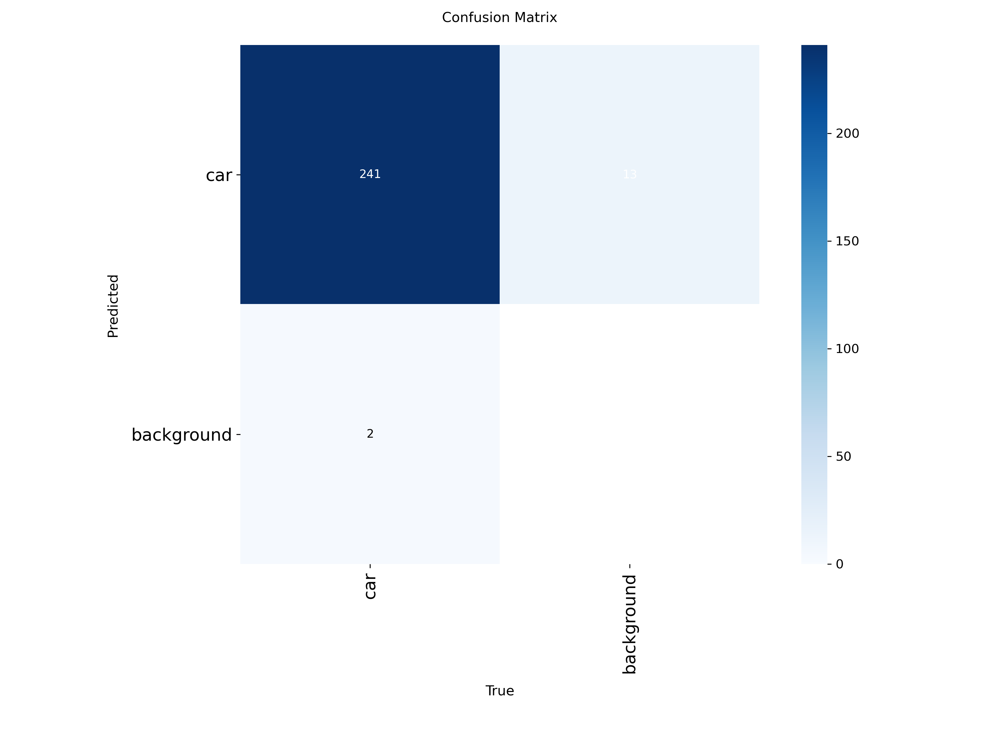

In [ ]:
IPyImage(filename='/content/runs/detect/train/confusion_matrix.png', width=600)

In [ ]:
model = YOLO('/content/runs/detect/train/weights/best.pt')

In [ ]:
preds = model('/content/datasets/dataset_vehiculos/images/test')


image 1/50 /content/datasets/dataset_vehiculos/images/test/frame_0449.jpg: 384x640 5 cars, 12.5ms
image 2/50 /content/datasets/dataset_vehiculos/images/test/frame_0450.jpg: 384x640 5 cars, 9.2ms
image 3/50 /content/datasets/dataset_vehiculos/images/test/frame_0451.jpg: 384x640 5 cars, 8.7ms
image 4/50 /content/datasets/dataset_vehiculos/images/test/frame_0452.jpg: 384x640 5 cars, 8.9ms
image 5/50 /content/datasets/dataset_vehiculos/images/test/frame_0453.jpg: 384x640 5 cars, 8.5ms
image 6/50 /content/datasets/dataset_vehiculos/images/test/frame_0454.jpg: 384x640 5 cars, 10.1ms
image 7/50 /content/datasets/dataset_vehiculos/images/test/frame_0455.jpg: 384x640 5 cars, 8.7ms
image 8/50 /content/datasets/dataset_vehiculos/images/test/frame_0456.jpg: 384x640 6 cars, 8.7ms
image 9/50 /content/datasets/dataset_vehiculos/images/test/frame_0457.jpg: 384x640 5 cars, 8.6ms
image 10/50 /content/datasets/dataset_vehiculos/images/test/frame_0458.jpg: 384x640 5 cars, 11.4ms
image 11/50 /content/data

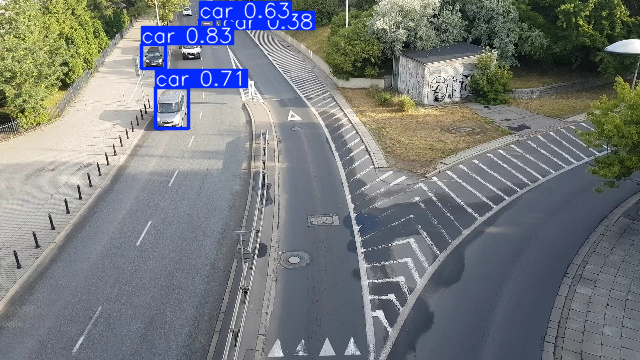

In [ ]:
# Mostrar predicciones
preds[49].show()

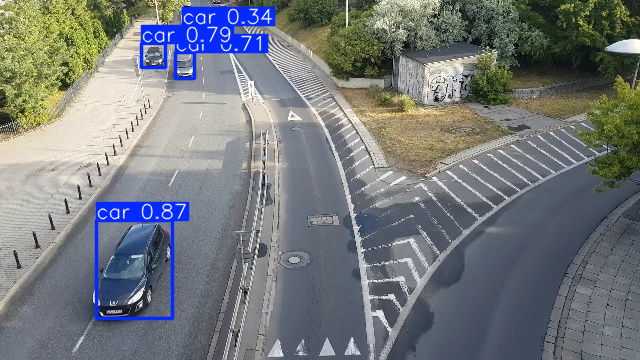

In [ ]:
# Mostrar predicciones
preds[15].show()

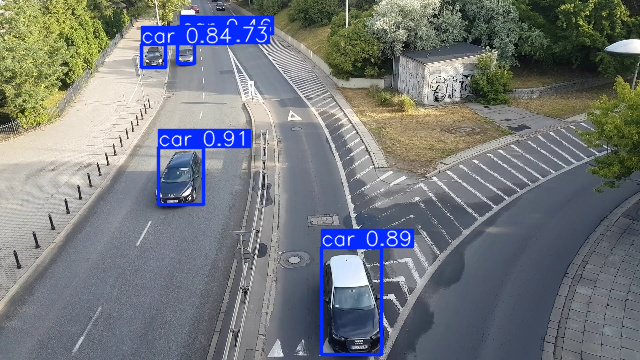

In [ ]:
# Mostrar predicciones
preds[1].show()

In [ ]:
from google.colab import files

# Ruta a tu modelo entrenado
path_to_model = '/content/runs/detect/train/weights/best.pt'

# Descargar el archivo
files.download(path_to_model)

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [ ]:
from ultralytics import YOLO

# Cargar tu modelo entrenado
model = YOLO('/content/runs/detect/train/weights/best.pt')


In [ ]:
# Ruta nueva imagen (asegúrate de que coincida con cómo la subiste)
ruta_nueva_imagen = '/content/datasets/pista.jpg' # O la ruta donde la hayas subido

# Realizar la predicción
results = model(ruta_nueva_imagen)


image 1/1 /content/datasets/pista.jpg: 416x640 3 cars, 11.1ms
Speed: 3.1ms preprocess, 11.1ms inference, 1.5ms postprocess per image at shape (1, 3, 416, 640)


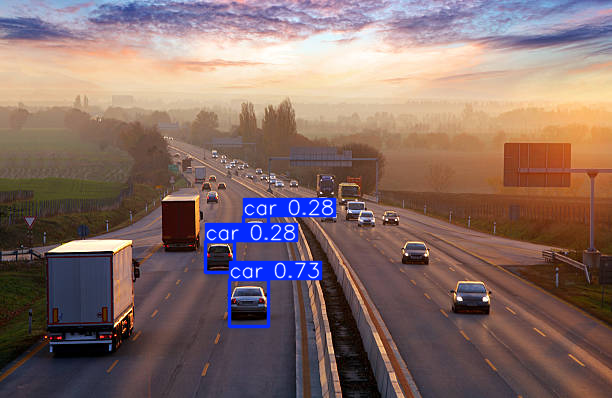

In [ ]:
results[0].show()

In [ ]:
!unzip "/content/datasets/carretera.zip" -d /content/datasets/carretera

Archive:  /content/datasets/carretera.zip
replace /content/datasets/carretera/carretera/cars1.jpg? [y]es, [n]o, [A]ll, [N]one, [r]ename: 

In [ ]:
# Lista con las rutas de las nuevas imágenes que quieres procesar
# Asegúrate de que estas imágenes estén subidas a Colab y las rutas sean correctas
rutas_nuevas_imagenes = [
    '/content/datasets/carretera/carretera/cars1.jpg',
    '/content/datasets/carretera/carretera/cerrada.jpg',
    '/content/datasets/carretera/carretera/const.jpg',
    '/content/datasets/carretera/carretera/morelos.jpeg',
    '/content/datasets/carretera/carretera/qro.jpg ',
    '/content/datasets/carretera/carretera/tec.jpg ',
    '/content/datasets/carretera/carretera/toluca.jpeg ',
    '/content/datasets/carretera/carretera/torres.jpg '
    # Puedes agregar más rutas aquí
]


--- Procesando imagen 1/8: /content/datasets/carretera/carretera/cars1.jpg ---

image 1/1 /content/datasets/carretera/carretera/cars1.jpg: 448x640 12 cars, 19.6ms
Speed: 3.1ms preprocess, 19.6ms inference, 1.7ms postprocess per image at shape (1, 3, 448, 640)
Mostrando imagen con detecciones:


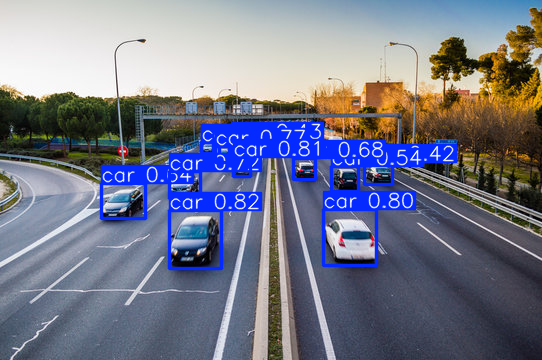


Información detallada de las detecciones:
Ocurrió un error inesperado durante la predicción para /content/datasets/carretera/carretera/cars1.jpg: 'Results' object has no attribute 'print'. See valid attributes below.

    A class for storing and manipulating inference results.

    This class provides comprehensive functionality for handling inference results from various
    Ultralytics models, including detection, segmentation, classification, and pose estimation.
    It supports visualization, data export, and various coordinate transformations.

    Attributes:
        orig_img (numpy.ndarray): The original image as a numpy array.
        orig_shape (Tuple[int, int]): Original image shape in (height, width) format.
        boxes (Boxes | None): Detected bounding boxes.
        masks (Masks | None): Segmentation masks.
        probs (Probs | None): Classification probabilities.
        keypoints (Keypoints | None): Detected keypoints.
        obb (OBB | None): Oriented bounding box

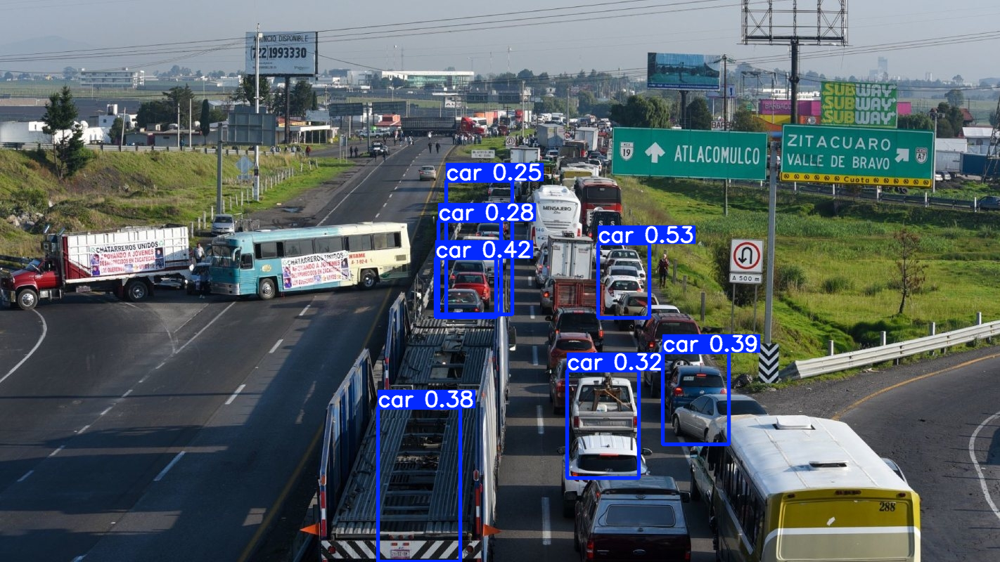


Información detallada de las detecciones:
Ocurrió un error inesperado durante la predicción para /content/datasets/carretera/carretera/cerrada.jpg: 'Results' object has no attribute 'print'. See valid attributes below.

    A class for storing and manipulating inference results.

    This class provides comprehensive functionality for handling inference results from various
    Ultralytics models, including detection, segmentation, classification, and pose estimation.
    It supports visualization, data export, and various coordinate transformations.

    Attributes:
        orig_img (numpy.ndarray): The original image as a numpy array.
        orig_shape (Tuple[int, int]): Original image shape in (height, width) format.
        boxes (Boxes | None): Detected bounding boxes.
        masks (Masks | None): Segmentation masks.
        probs (Probs | None): Classification probabilities.
        keypoints (Keypoints | None): Detected keypoints.
        obb (OBB | None): Oriented bounding b

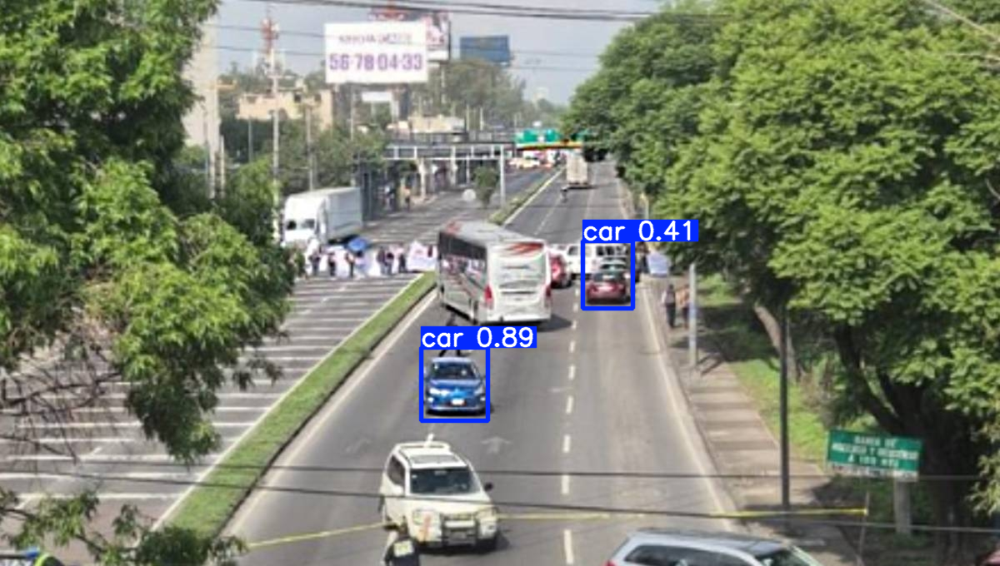


Información detallada de las detecciones:
Ocurrió un error inesperado durante la predicción para /content/datasets/carretera/carretera/const.jpg: 'Results' object has no attribute 'print'. See valid attributes below.

    A class for storing and manipulating inference results.

    This class provides comprehensive functionality for handling inference results from various
    Ultralytics models, including detection, segmentation, classification, and pose estimation.
    It supports visualization, data export, and various coordinate transformations.

    Attributes:
        orig_img (numpy.ndarray): The original image as a numpy array.
        orig_shape (Tuple[int, int]): Original image shape in (height, width) format.
        boxes (Boxes | None): Detected bounding boxes.
        masks (Masks | None): Segmentation masks.
        probs (Probs | None): Classification probabilities.
        keypoints (Keypoints | None): Detected keypoints.
        obb (OBB | None): Oriented bounding box

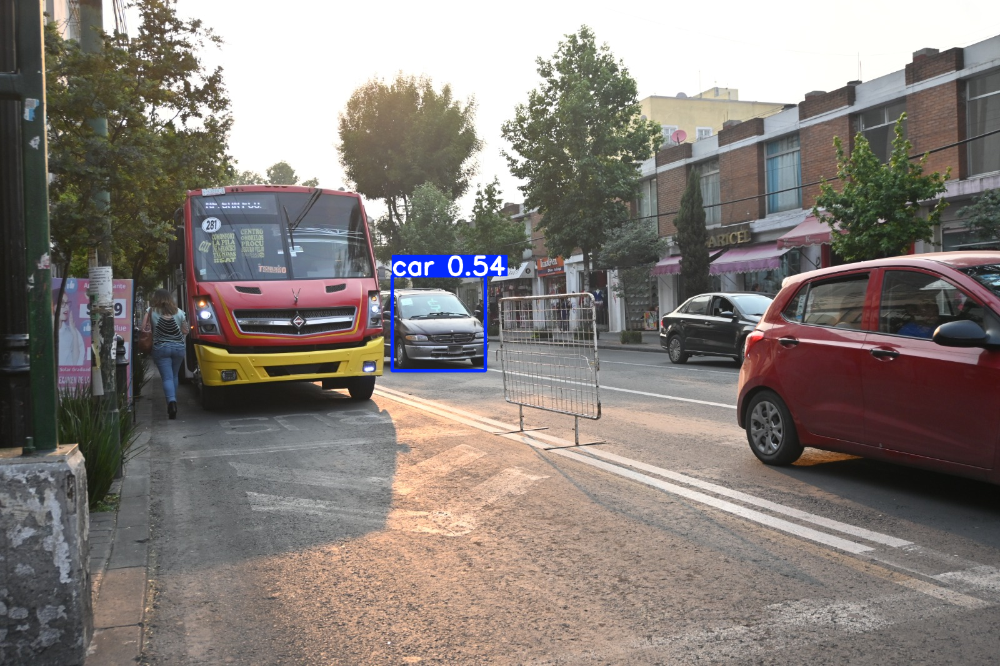


Información detallada de las detecciones:
Ocurrió un error inesperado durante la predicción para /content/datasets/carretera/carretera/morelos.jpeg: 'Results' object has no attribute 'print'. See valid attributes below.

    A class for storing and manipulating inference results.

    This class provides comprehensive functionality for handling inference results from various
    Ultralytics models, including detection, segmentation, classification, and pose estimation.
    It supports visualization, data export, and various coordinate transformations.

    Attributes:
        orig_img (numpy.ndarray): The original image as a numpy array.
        orig_shape (Tuple[int, int]): Original image shape in (height, width) format.
        boxes (Boxes | None): Detected bounding boxes.
        masks (Masks | None): Segmentation masks.
        probs (Probs | None): Classification probabilities.
        keypoints (Keypoints | None): Detected keypoints.
        obb (OBB | None): Oriented bounding 

In [ ]:
# Iterar sobre cada imagen en la lista
for i, ruta_imagen_actual in enumerate(rutas_nuevas_imagenes):
    print(f"\n--- Procesando imagen {i+1}/{len(rutas_nuevas_imagenes)}: {ruta_imagen_actual} ---")
    try:
        # Realizar la predicción para la imagen actual
        results = model(ruta_imagen_actual)

        # Mostrar los resultados para la imagen actual
        if results and len(results) > 0:
            print("Mostrando imagen con detecciones:")
            results[0].show() # Muestra la imagen con las cajas y etiquetas

            print("\nInformación detallada de las detecciones:")
            results[0].print() # Imprime un resumen en texto

            # Opcional: Iterar sobre las detecciones para obtener más detalles
            boxes = results[0].boxes
            names = results[0].names # Diccionario de nombres de clases {0: 'car', ...}

            if len(boxes) > 0:
                print(f"Se encontraron {len(boxes)} objetos:")
                for j, box in enumerate(boxes):
                    class_id = int(box.cls[0])
                    class_name = names[class_id]
                    confidence = float(box.conf[0])
                    print(f"  - Objeto {j+1}: {class_name} (confianza: {confidence:.2f})")
            else:
                print("No se detectaron objetos en esta imagen.")
        else:
            print("No se obtuvieron resultados de la predicción para esta imagen.")

    except FileNotFoundError:
        print(f"ERROR: No se encontró la imagen en la ruta: {ruta_imagen_actual}")
        print("Por favor, verifica que la imagen exista en Colab y la ruta sea correcta.")
    except Exception as e:
        print(f"Ocurrió un error inesperado durante la predicción para {ruta_imagen_actual}: {e}")

print("\n--- Proceso completado para todas las imágenes ---")

In [ ]:
from ultralytics import YOLO
from IPython.display import HTML, display
from base64 import b64encode
import os

# --- 1. Cargar tu modelo entrenado ---
model_path = '/content/runs/detect/train/weights/best.pt'
try:
    model = YOLO(model_path)
    print(f"Modelo cargado exitosamente desde: {model_path}")
except Exception as e:
    print(f"Error crítico al cargar el modelo desde {model_path}: {e}")
    print("Asegúrate de que el modelo 'best.pt' exista en esa ruta después del entrenamiento.")
    # Detener la ejecución si el modelo no se carga
    raise SystemExit("Fallo al cargar el modelo.")

# --- 2. Definir la ruta a tu video ---
# Sube tu video a Colab y reemplaza 'mi_video.mp4' con el nombre de tu archivo.
# Ejemplo: Si tu video se llama 'test_traffic.mp4' y lo subiste a /content/
video_input_path = '/content/datasets/video.mp4' # <-- ¡REEMPLAZA ESTO CON LA RUTA A TU VIDEO!

if not os.path.exists(video_input_path):
    print(f"Error: El archivo de video no se encuentra en: {video_input_path}")
    print("Por favor, sube tu video a Colab y verifica la ruta.")
else:
    print(f"Video de entrada encontrado: {video_input_path}")

    # --- 3. Procesar el video ---
    # stream=True: para eficiencia en memoria con videos.
    # save=True: para guardar el video resultante con las detecciones.
    # El video se guardará en una subcarpeta dentro de /content/runs/detect/ (ej. predict, predict2, etc.)
    print(f"Iniciando procesamiento del video: {os.path.basename(video_input_path)}...")
    try:
        results_generator = model(video_input_path, stream=True, save=True, project="/content/runs/detect", name="video_output")
        # El parámetro 'name' en model() define el nombre de la subcarpeta donde se guarda el resultado.
        # Así podemos predecir la ruta del video de salida más fácilmente.
        # El video se guardará en /content/runs/detect/video_output/

        # Es necesario iterar sobre el generador para que el procesamiento se realice.
        for result in results_generator:
            # No necesitamos hacer nada específico con cada 'result' si solo queremos guardar el video.
            # El procesamiento y guardado ocurren en segundo plano gracias a 'save=True'.
            pass # Simplemente iteramos para activar el procesamiento.

        print("Procesamiento de video completado.")

        # --- 4. Encontrar y mostrar el video procesado (opcional) ---
        # El video se guardará en /content/runs/detect/video_output/<nombre_del_video_original>
        # Si la carpeta 'video_output' ya existe, se creará 'video_output2', 'video_output3', etc.

        # Buscamos la carpeta de salida más reciente con el nombre base 'video_output'
        output_base_dir = "/content/runs/detect"
        output_folder_name_base = "video_output"

        potential_output_folders = sorted([
            d for d in os.listdir(output_base_dir)
            if d.startswith(output_folder_name_base) and os.path.isdir(os.path.join(output_base_dir, d))
        ], key=lambda x: os.path.getmtime(os.path.join(output_base_dir, x)), reverse=True)

        video_output_dir = None
        if potential_output_folders:
            video_output_dir = os.path.join(output_base_dir, potential_output_folders[0])

        video_output_path = None
        if video_output_dir:
            # El nombre del archivo de salida será el mismo que el de entrada
            expected_output_filename = os.path.basename(video_input_path)
            potential_video_output_path = os.path.join(video_output_dir, expected_output_filename)
            if os.path.exists(potential_video_output_path):
                video_output_path = potential_video_output_path
                print(f"Video procesado guardado en: {video_output_path}")

        if video_output_path:
            try:
                mp4 = open(video_output_path, 'rb').read()
                data_url = "data:video/mp4;base64," + b64encode(mp4).decode()
                display(HTML(f"""
                <h3>Video Procesado: {os.path.basename(video_output_path)}</h3>
                <video width=600 controls style="border:1px solid #ccc;">
                      <source src="{data_url}" type="video/mp4">
                      Tu navegador no soporta el elemento de video.
                </video>
                <p>Puedes descargar el video desde el explorador de archivos en: <code>{video_output_path}</code></p>
                """))
            except Exception as e:
                print(f"Error al intentar mostrar el video en Colab: {e}")
                print(f"Puedes descargar el video manualmente desde el explorador de archivos en: {video_output_path}")
        else:
            print(f"No se pudo encontrar el video de salida procesado.")
            print(f"Busca manualmente en las subcarpetas de '{output_base_dir}' (ej. video_output, video_output2, etc.).")

    except Exception as e:
        print(f"Ocurrió un error durante el procesamiento del video: {e}")

Modelo cargado exitosamente desde: /content/runs/detect/train/weights/best.pt
Video de entrada encontrado: /content/datasets/video.mp4
Iniciando procesamiento del video: video.mp4...

video 1/1 (frame 1/1803) /content/datasets/video.mp4: 384x640 7 cars, 162.8ms
video 1/1 (frame 2/1803) /content/datasets/video.mp4: 384x640 7 cars, 165.4ms
video 1/1 (frame 3/1803) /content/datasets/video.mp4: 384x640 7 cars, 154.0ms
video 1/1 (frame 4/1803) /content/datasets/video.mp4: 384x640 7 cars, 156.8ms
video 1/1 (frame 5/1803) /content/datasets/video.mp4: 384x640 7 cars, 151.7ms
video 1/1 (frame 6/1803) /content/datasets/video.mp4: 384x640 7 cars, 162.4ms
video 1/1 (frame 7/1803) /content/datasets/video.mp4: 384x640 7 cars, 162.9ms
video 1/1 (frame 8/1803) /content/datasets/video.mp4: 384x640 7 cars, 171.7ms
video 1/1 (frame 9/1803) /content/datasets/video.mp4: 384x640 8 cars, 158.1ms
video 1/1 (frame 10/1803) /content/datasets/video.mp4: 384x640 7 cars, 156.8ms
video 1/1 (frame 11/1803) /content/

In [ ]:
!pip install ultralytics --upgrade

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.0/1.0 MB 37.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 363.4/363.4 MB 3.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 13.8/13.8 MB 104.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 24.6/24.6 MB 73.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 883.7/883.7 kB 48.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 664.8/664.8 MB 1.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 211.5/211.5 MB 4.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 56.3/56.3 MB 11.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 127.9/127.9 MB 7.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 207.5/207.5 MB 5.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 21.1/21.1 MB 79.8 MB/s eta 0:00:00
  Attempting uninstall: nvidia-nvjitlink-cu12
    Found existing installation: nvidia-nvjitlink-cu12 12.5.82
    Uninstalling

In [ ]:
import os
import subprocess

# --- Configuración ---
# 1. Ruta a tu video original (el que da problemas)
input_video_path = "/content/datasets/videoal.mp4"

# 2. Ruta donde quieres guardar el video convertido
# Es buena idea darle un nombre ligeramente diferente, ej. añadiendo "_reencoded"
base, ext = os.path.splitext(input_video_path)
output_video_path = base + "_reencoded" + ext
# Esto generará algo como: "/content/datasets/dataset_vehiculos/videoal_reencoded.mp4"

# 3. (Opcional) Verificar si FFmpeg está instalado e instalarlo si no
try:
    subprocess.run(["ffmpeg", "-version"], check=True, capture_output=True, text=True)
    print("FFmpeg ya está instalado.")
except (subprocess.CalledProcessError, FileNotFoundError):
    print("FFmpeg no encontrado. Intentando instalar...")
    # Actualizar lista de paquetes
    install_result = subprocess.run(["apt-get", "update"], capture_output=True, text=True)
    if install_result.returncode != 0:
        print(f"Error al actualizar los paquetes (apt-get update): {install_result.stderr}")
    else:
        print("Lista de paquetes actualizada.")
        # Instalar FFmpeg
        install_result = subprocess.run(["apt-get", "install", "-y", "ffmpeg"], capture_output=True, text=True)
        if install_result.returncode == 0:
            print("FFmpeg instalado exitosamente.")
        else:
            print(f"Error al instalar FFmpeg: {install_result.stderr}")
            print("Por favor, intenta instalar FFmpeg manualmente o reinicia el entorno y vuelve a intentarlo.")
            # Puedes detener la ejecución aquí si la instalación falla
            # raise SystemExit("Fallo al instalar FFmpeg.")

# --- Conversión del Video ---
if not os.path.exists(input_video_path):
    print(f"ERROR: El archivo de video de entrada NO fue encontrado en: {input_video_path}")
    print("Por favor, asegúrate de que el video esté subido y la ruta sea correcta.")
else:
    print(f"Video de entrada encontrado: {input_video_path}")
    print(f"El video convertido se guardará en: {output_video_path}")
    print("Iniciando conversión con FFmpeg...")

    # Comando FFmpeg:
    # -i : archivo de entrada
    # -c:v libx264 : usa el códec de video H.264 (muy compatible)
    # -preset medium : un buen balance entre velocidad de compresión y calidad/tamaño
    # -crf 23 : Factor de Calidad Constante (18-28 es un rango razonable, menor es mejor calidad y mayor tamaño)
    # -c:a aac : usa el códec de audio AAC (común para MP4)
    # -b:a 128k : bitrate del audio
    # -pix_fmt yuv420p : formato de píxeles para máxima compatibilidad, especialmente con reproductores web/móviles
    # -y : sobrescribe el archivo de salida si ya existe sin preguntar
    ffmpeg_command = [
        "ffmpeg",
        "-i", input_video_path,
        "-c:v", "libx264",
        "-preset", "medium",
        "-crf", "23",
        "-c:a", "aac",
        "-b:a", "128k",
        "-pix_fmt", "yuv420p",
        "-y",
        output_video_path
    ]

    try:
        # Ejecutar el comando FFmpeg
        print(f"Ejecutando: {' '.join(ffmpeg_command)}")
        result = subprocess.run(ffmpeg_command, check=True, capture_output=True, text=True)
        print("¡Conversión de video completada exitosamente!")
        print(f"Video convertido guardado en: {output_video_path}")
        # FFmpeg a menudo imprime mucha información a stderr, incluso si tiene éxito
        if result.stdout:
            print("--- Salida de FFmpeg (stdout) ---")
            print(result.stdout)
        if result.stderr:
            print("--- Salida de FFmpeg (stderr - puede incluir información útil o errores) ---")
            print(result.stderr)

        # Verifica si el archivo de salida fue creado y tiene un tamaño > 0
        if os.path.exists(output_video_path) and os.path.getsize(output_video_path) > 0:
            print(f"El archivo de salida '{output_video_path}' fue creado y no está vacío.")
            print("Ahora puedes intentar usar este nuevo archivo en tu script de YOLO.")
        else:
            print(f"ERROR: El archivo de salida '{output_video_path}' no fue creado o está vacío después de la conversión.")

    except subprocess.CalledProcessError as e:
        print("ERROR: Ocurrió un error durante la conversión con FFmpeg.")
        print(f"Comando ejecutado: {' '.join(e.cmd)}")
        print(f"Código de retorno: {e.returncode}")
        print(f"Salida (stdout):\n{e.stdout}")
        print(f"Salida de error (stderr):\n{e.stderr}")
        print("La conversión falló. Revisa los mensajes de error de FFmpeg de arriba.")
    except FileNotFoundError:
        print("ERROR: No se encontró el comando 'ffmpeg'. Asegúrate de que esté instalado y en el PATH.")
        print("Si la instalación automática falló, intenta 'apt-get install ffmpeg' manualmente en una celda de Colab.")

FFmpeg ya está instalado.
Video de entrada encontrado: /content/datasets/videoal.mp4
El video convertido se guardará en: /content/datasets/videoal_reencoded.mp4
Iniciando conversión con FFmpeg...
Ejecutando: ffmpeg -i /content/datasets/videoal.mp4 -c:v libx264 -preset medium -crf 23 -c:a aac -b:a 128k -pix_fmt yuv420p -y /content/datasets/videoal_reencoded.mp4
ERROR: Ocurrió un error durante la conversión con FFmpeg.
Comando ejecutado: ffmpeg -i /content/datasets/videoal.mp4 -c:v libx264 -preset medium -crf 23 -c:a aac -b:a 128k -pix_fmt yuv420p -y /content/datasets/videoal_reencoded.mp4
Código de retorno: 1
Salida (stdout):

Salida de error (stderr):
ffmpeg version 4.4.2-0ubuntu0.22.04.1 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11 (Ubuntu 11.2.0-19ubuntu1)
  configuration: --prefix=/usr --extra-version=0ubuntu0.22.04.1 --toolchain=hardened --libdir=/usr/lib/x86_64-linux-gnu --incdir=/usr/include/x86_64-linux-gnu --arch=amd64 --enable-gpl --disable-stripping --ena

In [ ]:
from ultralytics import YOLO
from IPython.display import HTML, display
from base64 import b64encode
import os
import cv2 # Import OpenCV for direct video check

# --- 1. Cargar tu modelo entrenado ---
model_path = '/content/datasets/best.pt'
try:
    model = YOLO(model_path)
    print(f"Modelo cargado exitosamente desde: {model_path}")
except Exception as e:
    print(f"Error crítico al cargar el modelo desde {model_path}: {e}")
    print("Asegúrate de que el modelo 'best.pt' exista en esa ruta después del entrenamiento.")
    raise SystemExit("Fallo al cargar el modelo.")

# --- 2. Definir la ruta a tu video ---
video_input_path = '/content/datasets/alex.mov' # <-- ¡REEMPLAZA ESTO CON LA RUTA A TU VIDEO!

if not os.path.exists(video_input_path):
    print(f"Error: El archivo de video no se encuentra en: {video_input_path}")
    print("Por favor, sube tu video a Colab y verifica la ruta.")
    raise SystemExit("Video de entrada no encontrado.")
else:
    print(f"Video de entrada encontrado: {video_input_path}")

    # --- DEBUG: Intenta abrir el video con OpenCV directamente ---
    cap = cv2.VideoCapture(video_input_path)
    if not cap.isOpened():
        print(f"ERROR CRÍTICO: OpenCV no pudo abrir el video en: {video_input_path}")
        print("Esto sugiere que el archivo de video está corrupto, no es un formato soportado, o hay un problema con las dependencias de OpenCV/FFmpeg.")
        print("Por favor, verifica el archivo de video e intenta con uno diferente si es necesario.")
        cap.release() # Asegúrate de liberar incluso si no se abrió bien
        raise SystemExit("Fallo al abrir el video con OpenCV.")
    else:
        print(f"OpenCV pudo abrir el video exitosamente: {video_input_path}")
        # Obtener algunas propiedades (opcional, solo para info)
        fps = cap.get(cv2.CAP_PROP_FPS)
        width = int(cap.get(cv2.CAP_PROP_FRAME_WIDTH))
        height = int(cap.get(cv2.CAP_PROP_FRAME_HEIGHT))
        frame_count = int(cap.get(cv2.CAP_PROP_FRAME_COUNT))
        print(f"  Propiedades del video: {width}x{height} @ {fps:.2f} FPS, {frame_count} frames")
        cap.release() # Liberar el video después de la prueba

    # --- 3. Procesar el video ---
    print(f"Iniciando procesamiento del video con YOLO: {os.path.basename(video_input_path)}...")
    try:
        # Asegúrate que la carpeta base de 'runs' existe, aunque YOLO usualmente la crea
        os.makedirs("/content/runs/detect", exist_ok=True)

        results_generator = model.predict(
            source=video_input_path,
            stream=True,
            save=True,
            project="/content/runs/detect", # Directorio base para los resultados
            name="video_output",           # Nombre de la subcarpeta específica para esta ejecución
            exist_ok=True                  # Sobrescribe si la carpeta 'video_output' ya existe (o usa False para crear video_output2, etc.)
        )
        # El parámetro 'name' en model.predict() define el nombre de la subcarpeta.
        # Si 'exist_ok=False' (por defecto), y 'video_output' existe, creará 'video_output2', 'video_output3', etc.
        # Si 'exist_ok=True', usará 'video_output' y sobrescribirá su contenido.

        # Es necesario iterar sobre el generador para que el procesamiento se realice y se guarde el video.
        print("Procesando frames...")
        for i, result in enumerate(results_generator):
            if (i + 1) % 100 == 0: # Imprime un progreso cada 100 frames
                print(f"  Procesado frame {i+1}...")
            # No necesitamos hacer nada específico con cada 'result' aquí
            # si solo queremos guardar el video completo.
            # El procesamiento y guardado ocurren en segundo plano gracias a 'save=True'.
            pass
        print("Procesamiento de video completado.")

        # --- 4. Encontrar y mostrar el video procesado ---
        # El video se guardará en /content/runs/detect/video_output/<nombre_del_video_original>
        # si 'exist_ok=True' fue usado, o en la última carpeta creada si 'exist_ok=False'.

        output_base_dir = "/content/runs/detect"
        # El nombre de la carpeta de salida que especificamos en model.predict()
        # Si exist_ok=True, siempre será este.
        # Si exist_ok=False (default), podría ser video_output, video_output2, etc.
        # Por simplicidad y control, usar exist_ok=True es a veces más fácil para predecir la ruta.
        # Si prefieres el comportamiento de numeración automática, quita exist_ok=True
        # y usa la lógica original de búsqueda de la carpeta más reciente.

        # Lógica simplificada si usas exist_ok=True y un nombre fijo:
        # video_output_dir = os.path.join(output_base_dir, "video_output")

        # Lógica más robusta para encontrar la última carpeta generada (si no usas exist_ok=True o quieres ser general)
        potential_output_folders = []
        if os.path.exists(output_base_dir):
            potential_output_folders = sorted([
                d for d in os.listdir(output_base_dir)
                if d.startswith("video_output") and os.path.isdir(os.path.join(output_base_dir, d))
            ], key=lambda x: os.path.getmtime(os.path.join(output_base_dir, x)), reverse=True)

        video_output_dir = None
        if potential_output_folders:
            video_output_dir = os.path.join(output_base_dir, potential_output_folders[0])
            print(f"Carpeta de salida detectada: {video_output_dir}")
        else:
            # Esto puede pasar si 'exist_ok=True' y la carpeta es 'video_output' pero la búsqueda es para 'video_output*'
            # y no hay otras. Ajustemos para cubrir el caso de nombre exacto.
            exact_output_dir = os.path.join(output_base_dir, "video_output")
            if os.path.isdir(exact_output_dir):
                 video_output_dir = exact_output_dir
                 print(f"Carpeta de salida (nombre exacto): {video_output_dir}")


        video_output_path = None
        if video_output_dir and os.path.exists(video_output_dir):
            expected_output_filename = os.path.basename(video_input_path)
            potential_video_output_path = os.path.join(video_output_dir, expected_output_filename)
            if os.path.exists(potential_video_output_path):
                video_output_path = potential_video_output_path
                print(f"Video procesado guardado en: {video_output_path}")
            else:
                print(f"Video procesado NO encontrado en la ruta esperada: {potential_video_output_path}")
                print(f"Contenido de {video_output_dir}: {os.listdir(video_output_dir)}")

        if video_output_path:
            try:
                mp4 = open(video_output_path, 'rb').read()
                data_url = "data:video/mp4;base64," + b64encode(mp4).decode()
                display(HTML(f"""
                <h3>Video Procesado: {os.path.basename(video_output_path)}</h3>
                <video width=600 controls style="border:1px solid #ccc;">
                      <source src="{data_url}" type="video/mp4">
                      Tu navegador no soporta el elemento de video.
                </video>
                <p>Puedes descargar el video desde el explorador de archivos en Colab, en la ruta: <code>{video_output_path}</code></p>
                """))
            except Exception as e:
                print(f"Error al intentar mostrar el video en Colab: {e}")
                print(f"Puedes descargar el video manualmente desde el explorador de archivos en: {video_output_path}")
        else:
            print(f"No se pudo encontrar el video de salida procesado.")
            print(f"Busca manualmente en las subcarpetas de '{output_base_dir}' (ej. video_output, video_output2, etc.).")
            if video_output_dir and os.path.exists(video_output_dir):
                print(f"Contenido de la carpeta de salida más probable ({video_output_dir}): {os.listdir(video_output_dir)}")
            elif os.path.exists(output_base_dir):
                print(f"Contenido de la carpeta base de runs ({output_base_dir}): {os.listdir(output_base_dir)}")


    except Exception as e:
        print(f"Ocurrió un error durante el procesamiento del video con YOLO: {e}")
        import traceback
        traceback.print_exc()

Modelo cargado exitosamente desde: /content/datasets/best.pt
Video de entrada encontrado: /content/datasets/alex.mov
OpenCV pudo abrir el video exitosamente: /content/datasets/alex.mov
  Propiedades del video: 1280x720 @ 29.98 FPS, 2892 frames
Iniciando procesamiento del video con YOLO: alex.mov...
Procesando frames...

video 1/1 (frame 1/2892) /content/datasets/alex.mov: 384x640 2 cars, 12.6ms
video 1/1 (frame 2/2892) /content/datasets/alex.mov: 384x640 3 cars, 13.4ms
video 1/1 (frame 3/2892) /content/datasets/alex.mov: 384x640 1 car, 14.0ms
video 1/1 (frame 4/2892) /content/datasets/alex.mov: 384x640 1 car, 11.7ms
video 1/1 (frame 5/2892) /content/datasets/alex.mov: 384x640 1 car, 11.3ms
video 1/1 (frame 6/2892) /content/datasets/alex.mov: 384x640 1 car, 10.6ms
video 1/1 (frame 7/2892) /content/datasets/alex.mov: 384x640 2 cars, 12.0ms
video 1/1 (frame 8/2892) /content/datasets/alex.mov: 384x640 2 cars, 10.6ms
video 1/1 (frame 9/2892) /content/datasets/alex.mov: 384x640 2 cars, 13.9m

In [2]:
# ==============================================================================
# NUEVO BLOQUE: DETECCIÓN MULTI-CLASE CON MODELO YOLO PREENTRENADO
# ==============================================================================
# Este bloque utiliza un modelo YOLOv8 pre-entrenado (ej. yolov8n.pt)
# que puede detectar una variedad de objetos comunes (coches, personas, bicicletas, etc.)
# NO utiliza tu modelo 'best.pt' entrenado solo para coches.

from ultralytics import YOLO
from IPython.display import HTML, display
from base64 import b64encode
import os
import cv2 # Import OpenCV for direct video check

print("\n--- Iniciando Bloque de Detección Multi-Clase ---")

# --- 1. Cargar un modelo YOLO pre-entrenado (ej. yolov8n.pt para COCO) ---
# Estos modelos ya vienen entrenados en el dataset COCO.
# Clases comunes en COCO: person, bicycle, car, motorcycle, bus, truck, etc.
try:
    # Puedes probar otros modelos preentrenados:
    # "yolov8s.pt" (small), "yolov8m.pt" (medium) - más precisos pero más lentos.
    # "yolov8n.pt" (nano) es el más rápido.
    model_general = YOLO("yolov8n.pt")
    print(f"Modelo YOLO pre-entrenado ('yolov8n.pt') cargado exitosamente.")
    print("Este modelo puede detectar las siguientes clases (extracto):")
    # Mostrar algunas clases de ejemplo que puede detectar
    coco_classes = model_general.names
    example_classes = {k: coco_classes[k] for k in [0, 1, 2, 3, 5, 7] if k in coco_classes} # person, bicycle, car, motorcycle, bus, truck
    print(example_classes)
    # print("Todas las clases:", model_general.names) # Descomenta para ver todas las 80 clases
except Exception as e:
    print(f"Error crítico al cargar el modelo YOLO pre-entrenado: {e}")
    # Esto podría suceder si no hay conexión a internet para descargar el modelo la primera vez.
    raise SystemExit("Fallo al cargar el modelo pre-entrenado.")

# --- 2. Definir la ruta a tu video (la misma que antes) ---
video_input_path_multi = '/content/datasets/alex.mov' # <-- ¡REEMPLAZA SI TU VIDEO ESTÁ EN OTRA RUTA!

if not os.path.exists(video_input_path_multi):
    print(f"Error: El archivo de video no se encuentra en: {video_input_path_multi}")
    print("Por favor, sube tu video a Colab y verifica la ruta.")
    raise SystemExit("Video de entrada no encontrado para detección multi-clase.")
else:
    print(f"Video de entrada para detección multi-clase encontrado: {video_input_path_multi}")

    # --- DEBUG: Intenta abrir el video con OpenCV directamente ---
    cap_multi = cv2.VideoCapture(video_input_path_multi)
    if not cap_multi.isOpened():
        print(f"ERROR CRÍTICO: OpenCV no pudo abrir el video en: {video_input_path_multi}")
        cap_multi.release()
        raise SystemExit("Fallo al abrir el video con OpenCV para detección multi-clase.")
    else:
        print(f"OpenCV pudo abrir el video (para multi-clase) exitosamente: {video_input_path_multi}")
        cap_multi.release()

# --- 3. Procesar el video con el modelo GENERAL (preentrenado) ---
print(f"Iniciando procesamiento del video con YOLO (modelo general 'yolov8n.pt'): {os.path.basename(video_input_path_multi)}...")
try:
    os.makedirs("/content/runs/detect", exist_ok=True)

    # Usaremos un nombre de subcarpeta diferente para esta salida, ej: "video_output_general"
    # para no sobreescribir los resultados de tu modelo entrenado solo para coches.
    results_generator_multi = model_general.predict(
        source=video_input_path_multi,
        stream=True,
        save=True,
        project="/content/runs/detect",
        name="video_output_general_coco", # Nombre de la subcarpeta para estos resultados
        exist_ok=True # Sobrescribe si 'video_output_general_coco' ya existe
    )

    print("Procesando frames (modelo general)...")
    for i, result_multi in enumerate(results_generator_multi):
        if (i + 1) % 100 == 0: # Imprime un progreso cada 100 frames
            print(f"  Procesado frame {i+1} (modelo general)...")
        pass # El guardado ocurre en segundo plano gracias a save=True
    print("Procesamiento de video (modelo general) completado.")

    # --- 4. Encontrar y mostrar el video procesado (modelo general) ---
    # El video se guardará en /content/runs/detect/video_output_general_coco/<nombre_del_video_original>
    output_dir_multi = "/content/runs/detect/video_output_general_coco"
    video_output_path_multi = None

    if os.path.exists(output_dir_multi):
        expected_output_filename_multi = os.path.basename(video_input_path_multi)
        potential_video_output_path_multi = os.path.join(output_dir_multi, expected_output_filename_multi)
        if os.path.exists(potential_video_output_path_multi):
            video_output_path_multi = potential_video_output_path_multi
            print(f"Video (multi-clase) procesado guardado en: {video_output_path_multi}")
        else:
            print(f"Video (multi-clase) procesado NO encontrado en la ruta esperada: {potential_video_output_path_multi}")
            print(f"Contenido de {output_dir_multi}: {os.listdir(output_dir_multi) if os.path.exists(output_dir_multi) else 'Directorio no existe'}")
    else:
        print(f"La carpeta de salida esperada {output_dir_multi} no fue creada.")


    if video_output_path_multi:
        try:
            mp4_multi = open(video_output_path_multi, 'rb').read()
            data_url_multi = "data:video/mp4;base64," + b64encode(mp4_multi).decode()
            display(HTML(f"""
            <h3>Video Procesado (Modelo General Preentrenado - 'yolov8n.pt'): {os.path.basename(video_output_path_multi)}</h3>
            <video width=600 controls style="border:1px solid #ccc;">
                  <source src="{data_url_multi}" type="video/mp4">
                  Tu navegador no soporta el elemento de video.
            </video>
            <p>Puedes descargar el video desde el explorador de archivos en Colab, en la ruta: <code>{video_output_path_multi}</code></p>
            """))
        except Exception as e:
            print(f"Error al intentar mostrar el video (multi-clase) en Colab: {e}")
            print(f"Puedes descargar el video (multi-clase) manualmente desde: {video_output_path_multi}")
    else:
        print(f"No se pudo encontrar el video de salida (multi-clase) procesado.")
        print(f"Busca manualmente en la carpeta '{output_dir_multi}'.")

except Exception as e:
    print(f"Ocurrió un error durante el procesamiento del video con YOLO (modelo general): {e}")
    import traceback
    traceback.print_exc()

print("--- Fin Bloque de Detección Multi-Clase ---\n")

Creating new Ultralytics Settings v0.0.6 file ✅ 
View Ultralytics Settings with 'yolo settings' or at '/root/.config/Ultralytics/settings.json'
Update Settings with 'yolo settings key=value', i.e. 'yolo settings runs_dir=path/to/dir'. For help see https://docs.ultralytics.com/quickstart/#ultralytics-settings.

--- Iniciando Bloque de Detección Multi-Clase ---


100%|██████████| 6.25M/6.25M [00:00<00:00, 94.9MB/s]


Modelo YOLO pre-entrenado ('yolov8n.pt') cargado exitosamente.
Este modelo puede detectar las siguientes clases (extracto):
{0: 'person', 1: 'bicycle', 2: 'car', 3: 'motorcycle', 5: 'bus', 7: 'truck'}
Video de entrada para detección multi-clase encontrado: /content/datasets/alex.mov
OpenCV pudo abrir el video (para multi-clase) exitosamente: /content/datasets/alex.mov
Iniciando procesamiento del video con YOLO (modelo general 'yolov8n.pt'): alex.mov...
Procesando frames (modelo general)...

video 1/1 (frame 1/2892) /content/datasets/alex.mov: 384x640 1 person, 1 car, 62.7ms
video 1/1 (frame 2/2892) /content/datasets/alex.mov: 384x640 2 persons, 1 car, 1 umbrella, 8.6ms
video 1/1 (frame 3/2892) /content/datasets/alex.mov: 384x640 3 persons, 1 car, 8.2ms
video 1/1 (frame 4/2892) /content/datasets/alex.mov: 384x640 3 persons, 1 car, 8.5ms
video 1/1 (frame 5/2892) /content/datasets/alex.mov: 384x640 3 persons, 1 car, 7.5ms
video 1/1 (frame 6/2892) /content/datasets/alex.mov: 384x640 2 pers